In [11]:
%%capture
!pip install Pillow
!pip install lxml
!pip install requests
!pip install bs4
!pip install scipy
!pip install scikit-learn
!pip install numpy
!pip install matplotlib
!pip install pandas
!pip install opencv-python
!pip install pycopy-colorsys
!pip install pytesseract
!pip install selenium
!pip install urllib
!pip install urllib2
!pip install sklearn
!pip install webdriver-manager
!pip install html5lib
!pip install scikit-image


In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as cl
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from scipy.spatial import ConvexHull, convex_hull_plot_2d
import matplotlib.colors as mcolors
import warnings
from PIL import Image
import cv2 as cv
import math
import colorsys
import sys
from pytesseract import pytesseract
import re
import os
from time import sleep
from selenium import webdriver
from webdriver_manager.chrome import ChromeDriverManager
from bs4 import BeautifulSoup
import html5lib
from skimage import io
import urllib
from io import BytesIO
import requests
import pickle
warnings.filterwarnings('ignore')
np.set_printoptions(threshold=sys.maxsize)
plt.style.use('dark_background')

In [13]:
# --- GETS HTML ON SCROLLABLE --- #

chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument("--incognito")
chrome_options.add_argument('headless')
#ChromeDriverManager().install()
driver = webdriver.Chrome()
driver.get('https://nextgenstats.nfl.com/charts/list/pass/team/2022/')
SCROLL_PAUSE_TIME = 1
last_height = driver.execute_script("return document.body.scrollHeight")
scroll_limit = 100

count = 0
while True and count < scroll_limit:
    driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
    sleep(SCROLL_PAUSE_TIME)
    new_height = driver.execute_script("return document.body.scrollHeight")
    if new_height == last_height:
        break
    last_height = new_height
    count += 1
sleep(2)
html = driver.page_source
driver.close()
soup = BeautifulSoup(html, 'lxml')

In [4]:
# --- FUNCTIONS --- #
def line_intersection(line1, line2):
    xdiff = (line1[0][0] - line1[1][0], line2[0][0] - line2[1][0])
    ydiff = (line1[0][1] - line1[1][1], line2[0][1] - line2[1][1])

    def det(a, b):
        return a[0] * b[1] - a[1] * b[0]

    div = det(xdiff, ydiff)
    d = (det(*line1), det(*line2))
    x = det(d, xdiff) / div
    y = det(d, ydiff) / div
    return x, y


def PointsInCircum(start, end, n=10):
    return np.array([(np.cos(x), np.sin(x)) for x in np.arange(start, end, (end-start)/n)])


def smooth_convex(data, dist, num):
    # Store curve points
    smoothed_data = []
    for i in range(1, len(data) + 1):
        # Rename desired points
        p, pl, pr = data[i % len(data)], data[i - 1], data[(i + 1) % len(data)]
        # Calculate distances between points
        deltas = np.array((pl, pr)) - p
        # Calculate the perpendicular slopes
        perp_slopes = -deltas[:, 0] / deltas[:, 1]
        # Calculate the ratio of the distance between the points to start the curve
        t = dist/np.sum(deltas**2, axis=1)**0.5
        if any(t > 0.5):  # Limit the curve to start no further than half the line
            t /= np.max(t)*2
        # Find the new end points of the straight lights
        new_ends = np.array((pl*t[0], pr*t[1])) + np.array((p*(1-t[0]), p*(1-t[1])))
        # Calculate the intersection of the perpendicular slopes at the new end points
        center = line_intersection((new_ends[0], new_ends[0] + np.array([1, perp_slopes[0]])),
                                   (new_ends[1], new_ends[1] + np.array([1, perp_slopes[1]])))
        # Calculate the radius from the center to new end points
        radius = sum((new_ends[0] - center)**2)**0.5

        # Calculate radians of the start and end of the curve
        rad_s, rad_e = np.arctan(perp_slopes)
        # Adjust depending on placement of the points
        if deltas[1, 1] < 0:
            rad_e += np.pi
        if deltas[0, 1] > 0:
            rad_s += np.pi
        if deltas[0, 1] > 0 and deltas[1, 1] > 0:
            rad_e += 2*np.pi
        # Find the points along the curve in the determined radian bounds
        curve = PointsInCircum(rad_s, rad_e, n=num) * radius + center
        # Store curves
        smoothed_data.append(curve)
    return np.reshape(smoothed_data, (-1, 2))

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = mcolors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap


In [5]:
# --- COLLECT DATA FROM PICTURES --- #

# data = []
# dataDict = {}
# start = []
# end = []
# chartsHTML = []
# # --- TEXT FROM IMAGE --- #
# f = open('nextGenHTML.txt', 'r')
# lines = f.read()
# parse = BeautifulSoup(lines, "lxml").prettify()
# for r in re.finditer('<ul class="chart-stats-line">|<!-- -->\\n\s*<div class="chart-image">', parse):
#     start.append(r)
# for r in re.finditer('<p class="player-bio">|NFL Enterprises LLC', parse):
#     end.append(r)
# end.pop(0)

# # --- GETS CHARTS --- #
# for i in range(len(start)):
#     chartsHTML.append(str([parse[start[i].span()[0]:end[i].span()[1]]]))
# chartsHTML = chartsHTML[26:]


# for number in [z for z in range(len(chartsHTML)) if z != 374]:
#     print(number)
#     url = 'images/{0}.jpeg'.format(number)
#     white_counts = []
#     green_counts = []
#     blue_counts = []
#     red_counts = []
#     white_qualifier = 0
#     green_qualifier = 0
#     blue_qualifier = 0
#     red_qualifier = 0
#     text = []
#     name = []
#     green_kmeans = 0
#     white_kmeans = 0
#     blue_kmeans = 0
#     red_kmeans = 0

#     # --- GETS METADATA --- #
#     for r in re.finditer('\d+', chartsHTML[number]):
#         text.append(int(r.group(0)))
#     text = text[:5]
#     # print(text)
#     for r in re.finditer('<img alt=".+ Pass Chart" ', chartsHTML[number]):
#         name.append(str(r.group(0)))
#     # print(name)
#     name = name[0].split('"')
#     name = name[1].split(' ')
#     week = name[3]
#     name = name[0] + ' ' + name[1]
#     # week

#     # --- OPEN IMAGE IN OPENCV --- #
#     im = cv.imread(url, 1)
#     im = cv.cvtColor(im, cv.COLOR_BGR2RGB)
#     # plt.imshow(im)
#     w, h = im.shape[0], im.shape[1]

#     # --- RESHAPE INTO RECTANGLE AND UNWRAP --- #
#     src = np.float32([(115, 0), (485, 0), (-35, 325), (635, 325)]) #NW, NE, SW, SE
#     dst = np.float32([(0, 600), (456.857142857, 600), (0, 0), (456.857142857, 0)])
#     h, w = im.shape[:2]
#     M = cv.getPerspectiveTransform(src, dst)
#     im = cv.warpPerspective(im, M, (w, h), flags=cv.INTER_LINEAR)
#     im = cv.flip(im, 0)
#     im = im[0:600 ,0:457]
#     im = cv.rectangle(im, (0, 507), (20, 493), (0, 0, 0), -1)
#     im = cv.rectangle(im, (457, 507), (435, 493), (0, 0, 0), -1)

#     # --- WHITE THRESHOLDING --- #
#     if (text[1] - text[0] - text[4]) != 0:
#         white_lower = np.array([180, 180, 180])
#         white_upper = np.array([255, 255, 255])
#         white = cv.inRange(im, white_lower, white_upper)
#         white_text = text[1] - text[0] - text[4]

#         # --- WHITE ELIMINATE NOISE --- #
#         rows,cols = white.shape
#         white_threshold = []
#         for y in range(rows):
#             for x in range(cols):
#                 if white[y, x] == 255:
#                     white_threshold.append([x, y])
#         white_threshold = np.array(white_threshold)
#         if len(white_threshold) != 0:
#             db = DBSCAN(eps=4, min_samples=10).fit(white_threshold)
#             labels = db.labels_
#             white_dbscan = white_threshold[labels != -1]

#             # --- WHITE K-MEANS CLUSTERING --- #
#             if len(white_dbscan) != 0:
#                 white_kmeans = KMeans(n_clusters = white_text, init = "k-means++").fit(white_dbscan)
#                 if white_kmeans != 0:
#                     for i in range(0, white_text):
#                         white_counts.append(np.count_nonzero(white_kmeans.labels_ == i))
#                     white_qualifier = (sum(white_counts) / len(white_counts)) / 2
#                     while (min(white_counts) < white_qualifier) or ((white_qualifier * 2) < 32):
#                         # print('White Counts: ' + str(white_counts))
#                         # print('White Qualifier: ' + str(white_qualifier))
#                         white_text = white_text - 1
#                         # print(white_text)
#                         if len(white_dbscan) != 0:
#                             white_kmeans = KMeans(n_clusters = white_text, init = "k-means++").fit(white_dbscan)
#                         white_counts = []
#                         for i in range(0, white_text):
#                             white_counts.append(np.count_nonzero(white_kmeans.labels_ == i))
#                             white_qualifier = (sum(white_counts) / len(white_counts)) / 2

#     # --- GREEN THRESHOLDING --- #
#     if (text[0] - text[3]) != 0:
#         green_lower = np.array([60, 80, 40])
#         green_upper = np.array([130, 255, 75])
#         green = cv.inRange(im, green_lower, green_upper)
#         green_text = text[0] - text[3]

#         # --- GREEN ELIMINATE NOISE --- #
#         rows,cols = green.shape
#         green_threshold = []
#         for y in range(rows):
#             for x in range(cols):
#                 if green[y, x] == 255:
#                     green_threshold.append([x, y])
#         green_threshold = np.array(green_threshold)
#         if len(green_threshold) != 0:
#             db = DBSCAN(eps=4, min_samples=10).fit(green_threshold)
#             labels = db.labels_
#             green_dbscan = green_threshold[labels != -1]

#             # --- GREEN K-MEANS CLUSTERING --- #
#             if len(green_dbscan) != 0:
#                 green_kmeans = KMeans(n_clusters = green_text, init = "k-means++").fit(green_dbscan)

#     # --- BLUE THRESHOLDING --- #
#     if text[3] != 0:
#         blue_lower = np.array([0, 50, 90])
#         blue_upper = np.array([10, 60, 200])
#         blue = cv.inRange(im, blue_lower, blue_upper)
#         blue_text = text[3]

#         # --- BLUE ELIMINATE NOISE --- #
#         rows,cols = blue.shape
#         blue_threshold = []
#         for y in range(rows):
#             for x in range(cols):
#                 if blue[y, x] == 255:
#                     blue_threshold.append([x, y])
#         blue_threshold = np.array(blue_threshold)
#         if len(blue_threshold) != 0:
#             db = DBSCAN(eps=4, min_samples=5).fit(blue_threshold)
#             labels = db.labels_
#             blue_dbscan = blue_threshold[labels != -1]
#             # print(blue_text)
#             # --- BLUE K-MEANS CLUSTERING --- #
#             if len(blue_dbscan) != 0:
#                 blue_kmeans = KMeans(n_clusters = blue_text, init = "k-means++").fit(blue_dbscan)

#     # --- RED THRESHOLDING --- #
#     if text[4] != 0:
#         # red = []
#         red_lower = np.array([100, 0, 0])
#         red_upper = np.array([255, 40, 40])
#         red = cv.inRange(im, red_lower, red_upper)
#         red_text = text[4]
#         # plt.imshow(cv.flip(red, 0))
#         # print(red_text)
#         # --- RED ELIMINATE NOISE --- #
#         rows,cols = red.shape
#         red_threshold = []
#         for y in range(rows):
#             for x in range(cols):
#                 if red[y, x] == 255:
#                     red_threshold.append([x, y])
#         # print(red)
#         # print(red_text)
#         red_threshold = np.array(red_threshold)
#         # print(red_threshold)
#         if len(red_threshold) != 0:
#             db = DBSCAN(eps=4, min_samples=10).fit(red_threshold)
#             labels = db.labels_
#             red_dbscan = red_threshold[labels != -1]

#             # --- RED K-MEANS CLUSTERING --- #
#             if len(red_dbscan) != 0:
#                 red_kmeans = KMeans(n_clusters = red_text, init = "k-means++").fit(red_dbscan)

#     # if green_kmeans != 0:
#     #     plt.scatter(green_kmeans.cluster_centers_[:, 0], green_kmeans.cluster_centers_[:, 1], c = 'limegreen')
#     # if white_kmeans != 0:
#     #     plt.scatter(white_kmeans.cluster_centers_[:, 0], white_kmeans.cluster_centers_[:, 1], c = 'white')
#     # if blue_kmeans != 0:
#     #     plt.scatter(blue_kmeans.cluster_centers_[:, 0], blue_kmeans.cluster_centers_[:, 1], c = 'royalblue')
#     # if red_kmeans != 0:
#     #     plt.scatter(red_kmeans.cluster_centers_[:, 0], red_kmeans.cluster_centers_[:, 1], c = 'red')
#     # plt.gca().invert_yaxis()
#     # plt.show()
#     # plt.close()

#     if green_kmeans != 0:
#         for i in range(len(green_kmeans.cluster_centers_)):
#             data.append((name, week, green_kmeans.cluster_centers_[:, 0][i], green_kmeans.cluster_centers_[:, 1][i], 'Complete'))
#     if white_kmeans != 0:
#         for i in range(len(white_kmeans.cluster_centers_)):
#             data.append((name, week, white_kmeans.cluster_centers_[:, 0][i], white_kmeans.cluster_centers_[:, 1][i], 'Incomplete'))
#     if blue_kmeans != 0:
#         for i in range(len(blue_kmeans.cluster_centers_)):
#             data.append((name, week, blue_kmeans.cluster_centers_[:, 0][i], blue_kmeans.cluster_centers_[:, 1][i], 'Touchdown'))
#     if red_kmeans != 0:
#         for i in range(len(red_kmeans.cluster_centers_)):
#             data.append((name, week, red_kmeans.cluster_centers_[:, 0][i], red_kmeans.cluster_centers_[:, 1][i], 'Interception'))
#     # print(number)
#     # print(data[-1])
    
# # plt.gca().invert_yaxis()
# for item in data:
#     if (item in dataDict):
#         dataDict[item] += 1
#     else:
#         dataDict[item] = 1

# len(dataDict)

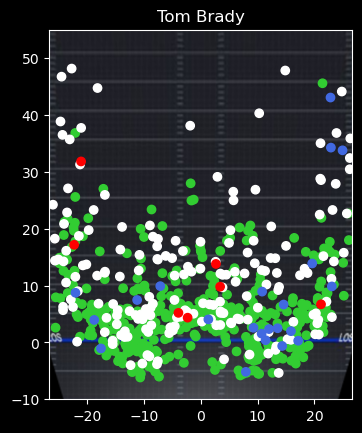

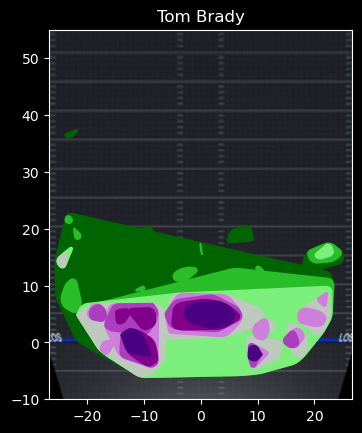

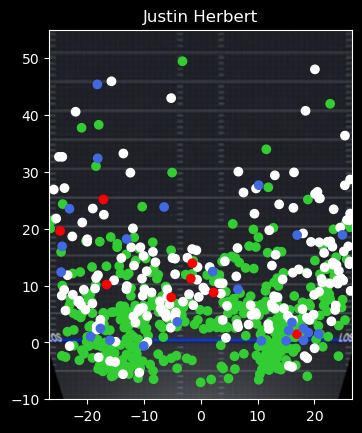

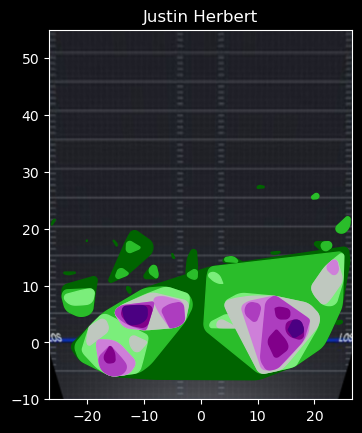

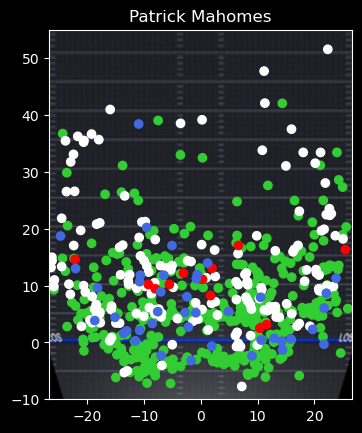

...

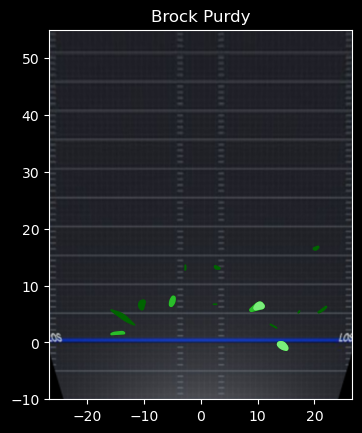

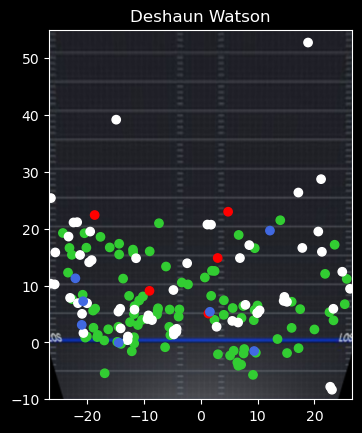

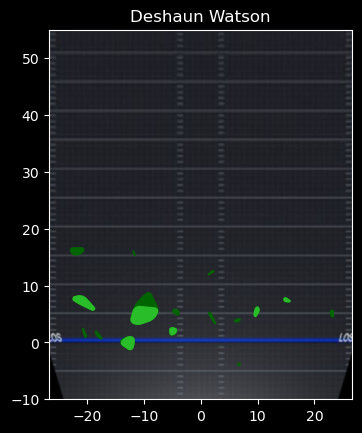

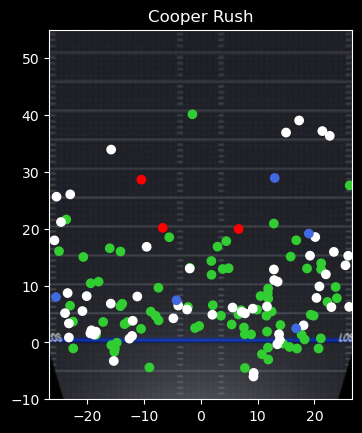

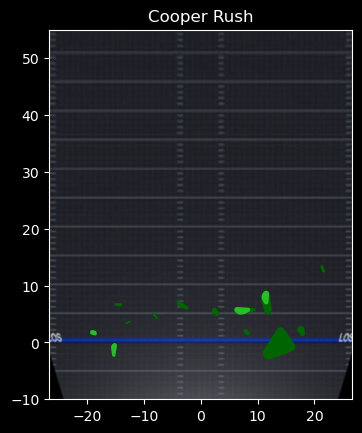

In [ ]:
names = ['Tom Brady', 'Justin Herbert', 'Patrick Mahomes', 'Kirk Cousins', 'Joe Burrow', 'Jared Goff', 'Trevor Lawrence', 'Geno Smith', 'Josh Allen', 'Aaron Rodgers', 'Derek Carr', 'Russell Wilson', 'Davis Mills', 'Daniel Jones', 'Matt Ryan', 'Jalen Hurts', 'Mac Jones', 'Tua Tagovailoa', 'Dak Prescott', 'Kyler Murray', 'Kenny Pickett', 'Andy Dalton', 'Jacoby Brissett', 'Baker Mayfield', 'Lamar Jackson', 'Ryan Tannehill', 'Justin Fields', 'Jimmy Garoppolo', 'Matthew Stafford', 'Marcus Mariota', 'Carson Wentz', 'Taylor Heinicke', 'Zach Wilson', 'Joe Flacco', 'Mitchell Trubisky', 'Mike White', 'Brock Purdy', 'Deshaun Watson', 'Cooper Rush']
count = 0

for nme in names:
    file1 = open("DictionaryDataPickle.txt","rb")
    DataDict = pickle.load(open("DictionaryDataPickle.txt", "rb"))
    file1.close()
    df = pd.Series(DataDict).reset_index()
    df.columns = ['name', 'week', 'x', 'y', 'type', 'instances']

    df = df[(df['name'] == nme)].sort_values(by=['name', 'type', 'x', 'y'])
    df['y'] = (-(df['y'] * (65/600)) + 65) - 10
    df['x'] = (df['x'] * (53.333333/457)) - (53.333333/2)

    colors = {'Complete': 'limegreen', 'Incomplete': 'white', 'Touchdown': 'royalblue', 'Interception': 'red'}
    pic = plt.imread('images/field.png')
    fig, ax = plt.subplots()
    ax.imshow(pic, extent=[-(53.333333/2), (53.333333/2), -10, 55])
    ax.scatter(df['x'], df['y'], c = df['type'].map(colors))
    ax.set_title(df['name'].iloc[0])
    path = 'test/' + str(count) + 'a.png'
    ax.figure.savefig(path)

    layers = list(range(3, 19, 2))
    j = 0
    dist = 1.75
    cmap = cl.LinearSegmentedColormap.from_list("", ["darkgreen", "limegreen", 'palegreen', 'plum', "mediumorchid", "darkmagenta", 'indigo'])
    colors = cmap(np.linspace(0, 1, len(layers)))

    pic = plt.imread('images/field.png')
    fig, ax = plt.subplots()
    ax.imshow(pic, extent=[-(53.333333/2), (53.333333/2), -10, 55])
    ax.set_title(df['name'].iloc[0])

    for i in list(range(0, len(layers), 1)): 
        locations = df[['x', 'y']]
        X = locations
        #-----------------------------------------------------#
        db = DBSCAN(eps=dist, min_samples=layers[i]).fit(X)
        #-----------------------------------------------------#
        clusters = pd.DataFrame(db.fit_predict(locations))
        labels = db.labels_
        unique_labels = set(labels)
        core_samples_mask = np.zeros_like(labels, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        for k in unique_labels:
            if k != -1:
                class_member_mask = labels == k
                xy = X[class_member_mask]
                if len(xy) >= layers[i]:
                    hull = ConvexHull(xy)
                    if hull.volume > 0.0015:
                        xy_smooth = smooth_convex(xy.iloc[hull.vertices].to_numpy(), 1, 10)
                        ax.fill(xy_smooth[:, 0], xy_smooth[:, 1], c = colors[i], alpha=1)
    path = 'test/' + str(count) + 'b.png'
    ax.figure.savefig(path)
    count += 1


                        

In [ ]:

#       ██████╗ ████████╗ ██████╗
#       ██╔══██╗╚══██╔══╝██╔════╝
#       ██████╔╝   ██║   ██║     
#       ██╔══██╗   ██║   ██║     
#       ██████╔╝   ██║   ╚██████╗
#       ╚═════╝    ╚═╝    ╚═════╝





#        ▄▄▄▄▄▄▄▄▄▄▄  ▄▄▄▄▄▄▄▄▄▄▄  ▄▄▄▄▄▄▄▄▄▄▄  ▄▄▄▄▄▄▄▄▄▄▄  ▄         ▄  ▄            ▄▄▄▄▄▄▄▄▄▄   ▄▄▄▄▄▄▄▄▄▄▄  ▄            ▄                 ▄▄        ▄  ▄▄▄▄▄▄▄▄▄▄▄  ▄           
#       ▐░░░░░░░░░░░▌▐░░░░░░░░░░░▌▐░░░░░░░░░░░▌▐░░░░░░░░░░░▌▐░▌       ▐░▌▐░▌          ▐░░░░░░░░░░▌ ▐░░░░░░░░░░░▌▐░▌          ▐░▌               ▐░░▌      ▐░▌▐░░░░░░░░░░░▌▐░▌          
#       ▐░█▀▀▀▀▀▀▀▀▀ ▐░█▀▀▀▀▀▀▀█░▌▐░█▀▀▀▀▀▀▀█░▌▐░█▀▀▀▀▀▀▀█░▌▐░▌       ▐░▌▐░▌          ▐░█▀▀▀▀▀▀▀█░▌▐░█▀▀▀▀▀▀▀█░▌▐░▌          ▐░▌               ▐░▌░▌     ▐░▌▐░█▀▀▀▀▀▀▀▀▀ ▐░▌          
#       ▐░▌          ▐░▌       ▐░▌▐░▌       ▐░▌▐░▌       ▐░▌▐░▌       ▐░▌▐░▌          ▐░▌       ▐░▌▐░▌       ▐░▌▐░▌          ▐░▌               ▐░▌▐░▌    ▐░▌▐░▌          ▐░▌          
#       ▐░█▄▄▄▄▄▄▄▄▄ ▐░█▄▄▄▄▄▄▄█░▌▐░█▄▄▄▄▄▄▄█░▌▐░█▄▄▄▄▄▄▄█░▌▐░▌   ▄   ▐░▌▐░▌          ▐░█▄▄▄▄▄▄▄█░▌▐░█▄▄▄▄▄▄▄█░▌▐░▌          ▐░▌               ▐░▌ ▐░▌   ▐░▌▐░█▄▄▄▄▄▄▄▄▄ ▐░▌          
#       ▐░░░░░░░░░░░▌▐░░░░░░░░░░░▌▐░░░░░░░░░░░▌▐░░░░░░░░░░░▌▐░▌  ▐░▌  ▐░▌▐░▌          ▐░░░░░░░░░░▌ ▐░░░░░░░░░░░▌▐░▌          ▐░▌               ▐░▌  ▐░▌  ▐░▌▐░░░░░░░░░░░▌▐░▌          
#        ▀▀▀▀▀▀▀▀▀█░▌▐░█▀▀▀▀▀▀▀▀▀ ▐░█▀▀▀▀█░█▀▀ ▐░█▀▀▀▀▀▀▀█░▌▐░▌ ▐░▌░▌ ▐░▌▐░▌          ▐░█▀▀▀▀▀▀▀█░▌▐░█▀▀▀▀▀▀▀█░▌▐░▌          ▐░▌               ▐░▌   ▐░▌ ▐░▌▐░█▀▀▀▀▀▀▀▀▀ ▐░▌          
#                 ▐░▌▐░▌          ▐░▌     ▐░▌  ▐░▌       ▐░▌▐░▌▐░▌ ▐░▌▐░▌▐░▌          ▐░▌       ▐░▌▐░▌       ▐░▌▐░▌          ▐░▌               ▐░▌    ▐░▌▐░▌▐░▌          ▐░▌          
#        ▄▄▄▄▄▄▄▄▄█░▌▐░▌          ▐░▌      ▐░▌ ▐░▌       ▐░▌▐░▌░▌   ▐░▐░▌▐░█▄▄▄▄▄▄▄▄▄ ▐░█▄▄▄▄▄▄▄█░▌▐░▌       ▐░▌▐░█▄▄▄▄▄▄▄▄▄ ▐░█▄▄▄▄▄▄▄▄▄      ▐░▌     ▐░▐░▌▐░▌          ▐░█▄▄▄▄▄▄▄▄▄ 
#       ▐░░░░░░░░░░░▌▐░▌          ▐░▌       ▐░▌▐░▌       ▐░▌▐░░▌     ▐░░▌▐░░░░░░░░░░░▌▐░░░░░░░░░░▌ ▐░▌       ▐░▌▐░░░░░░░░░░░▌▐░░░░░░░░░░░▌     ▐░▌      ▐░░▌▐░▌          ▐░░░░░░░░░░░▌
#        ▀▀▀▀▀▀▀▀▀▀▀  ▀            ▀         ▀  ▀         ▀  ▀▀       ▀▀  ▀▀▀▀▀▀▀▀▀▀▀  ▀▀▀▀▀▀▀▀▀▀   ▀         ▀  ▀▀▀▀▀▀▀▀▀▀▀  ▀▀▀▀▀▀▀▀▀▀▀       ▀        ▀▀  ▀            ▀▀▀▀▀▀▀▀▀▀▀ 
                                                                                                                                                                              




#Fonts: BIG, ELECTRONIC, BTC 